In [1]:
import os
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision.models.detection import maskrcnn_resnet50_fpn
import cv2

In [2]:
NUM_CLASSES = 34

model = maskrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, NUM_CLASSES)

model.load_state_dict(torch.load('../model/best_model.pth'))
model.eval()

/home/emprise/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/emprise/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [3]:
test_npz_path = '../data/training/maskrcnn/bag_1/callback_50.npz'
npz_data = np.load(test_npz_path)
test_image = (torch.tensor(npz_data['image']) / 255.).permute(2, 0, 1)[None, :]
test_image

tensor([[[[0.6000, 0.6000, 0.6000,  ..., 0.6549, 0.6627, 0.6549],
          [0.5922, 0.5882, 0.6000,  ..., 0.6549, 0.6510, 0.6510],
          [0.5922, 0.5882, 0.5922,  ..., 0.6471, 0.6549, 0.6510],
          ...,
          [0.2118, 0.2118, 0.2157,  ..., 0.5961, 0.5882, 0.5882],
          [0.2235, 0.2235, 0.2235,  ..., 0.5961, 0.6039, 0.5843],
          [0.2196, 0.2196, 0.2235,  ..., 0.6000, 0.5882, 0.5843]],

         [[0.5843, 0.5843, 0.5843,  ..., 0.6510, 0.6510, 0.6431],
          [0.5765, 0.5725, 0.5843,  ..., 0.6510, 0.6471, 0.6471],
          [0.5765, 0.5725, 0.5765,  ..., 0.6431, 0.6510, 0.6471],
          ...,
          [0.2157, 0.2157, 0.2196,  ..., 0.5961, 0.5922, 0.5922],
          [0.2157, 0.2157, 0.2157,  ..., 0.5961, 0.6078, 0.5882],
          [0.2039, 0.2039, 0.2078,  ..., 0.6000, 0.5922, 0.5882]],

         [[0.5569, 0.5569, 0.5412,  ..., 0.6510, 0.6392, 0.6314],
          [0.5490, 0.5451, 0.5412,  ..., 0.6510, 0.6471, 0.6471],
          [0.5490, 0.5451, 0.5412,  ..., 0

In [4]:
pred = model(test_image)
print(len(pred))
pred[0]

1


{'boxes': tensor([[ 599.8917,  300.8364,  677.8090,  377.6771],
         [ 642.9415,  112.5962,  739.6637,  207.3424],
         [ 541.4716,  115.5732,  632.6165,  185.2630],
         [ 560.4036,  202.1860,  636.0215,  290.8879],
         [ 682.3021,  327.7650,  762.2089,  392.5585],
         [ 732.6474,  168.9518,  790.8691,  227.5262],
         [ 506.9573,  297.0784,  584.0202,  369.1895],
         [ 725.7384,  279.2270,  804.6039,  316.9560],
         [ 735.7972,  262.0851,  824.3382,  293.8964],
         [ 507.6717,  223.2627,  548.9279,  267.5469],
         [ 730.2913,  258.9005,  820.8394,  321.1924],
         [ 651.1158,  232.1602,  698.4915,  280.3051],
         [ 725.3840,  283.9516,  771.4898,  315.2303],
         [ 741.5692,  174.1410,  795.3127,  242.5702],
         [ 507.6982,  300.1986,  585.3179,  381.8997],
         [ 512.5452,  316.8302,  549.5586,  356.8723],
         [ 685.1816,  342.2910,  775.6191,  409.9568],
         [ 648.7087,  234.0464,  699.2236,  278.9755],
 

In [ ]:
import json

with open('../data/json/id_to_color.json', 'r') as f:
    id_to_color = json.load(f)
with open('../data/json/id_to_food_mapping.json', 'r') as f:
    id_to_food = json.load(f)

dict_keys(['boxes', 'labels', 'scores', 'masks'])
PREDICTION :: 1, SCORE :: 0.9570621848106384
599


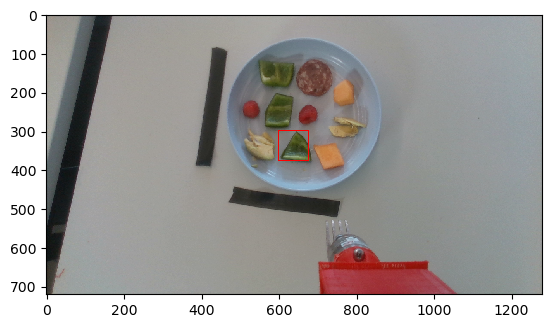

PREDICTION :: 8, SCORE :: 0.8851349353790283
642


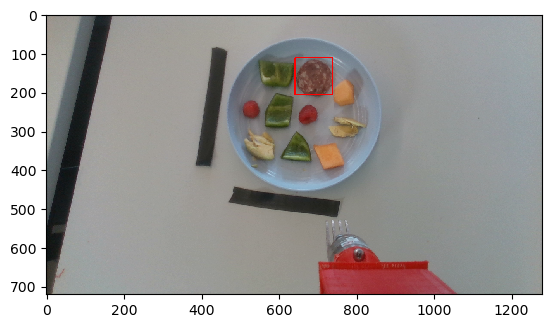

PREDICTION :: 1, SCORE :: 0.7724408507347107
541


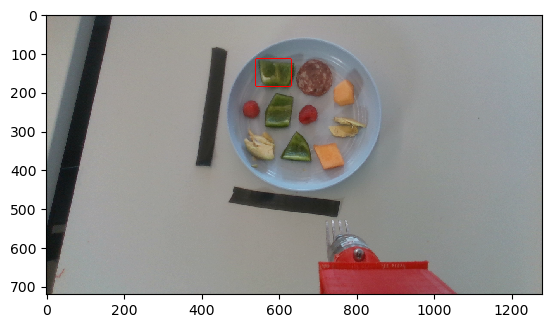

PREDICTION :: 1, SCORE :: 0.7698476314544678
560


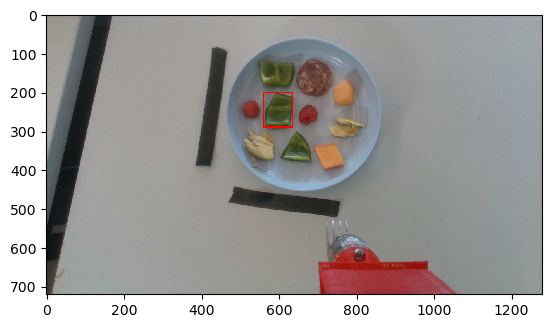

PREDICTION :: 2, SCORE :: 0.6382583379745483
682


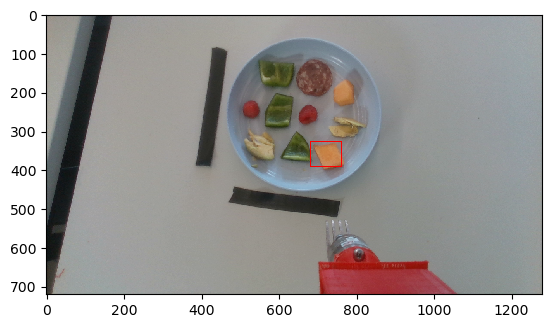

PREDICTION :: 2, SCORE :: 0.6279295086860657
732


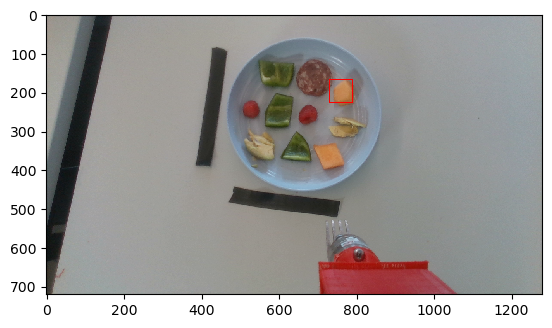

PREDICTION :: 5, SCORE :: 0.5469000339508057
506


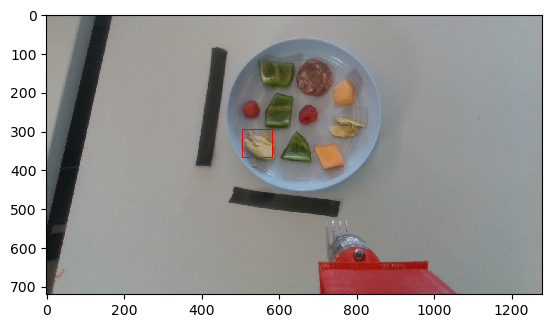

PREDICTION :: 5, SCORE :: 0.5460787415504456
725


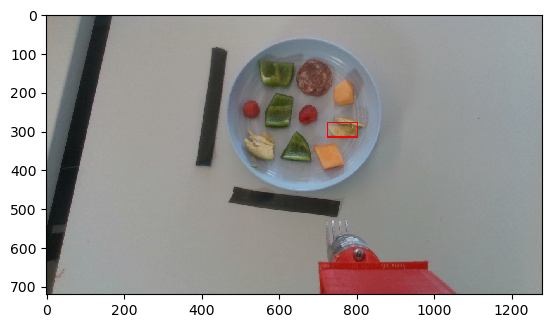

PREDICTION :: 5, SCORE :: 0.2819054126739502
735


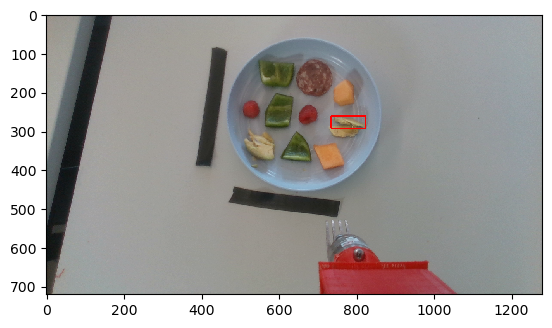

PREDICTION :: 4, SCORE :: 0.274522989988327
507


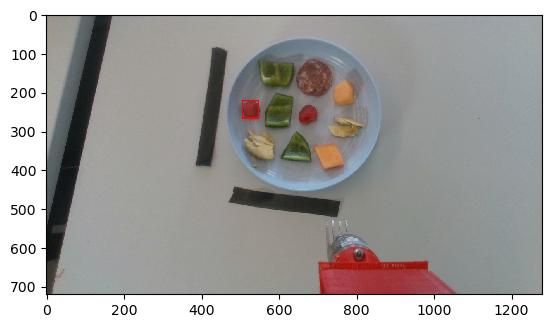

PREDICTION :: 5, SCORE :: 0.26383739709854126
730


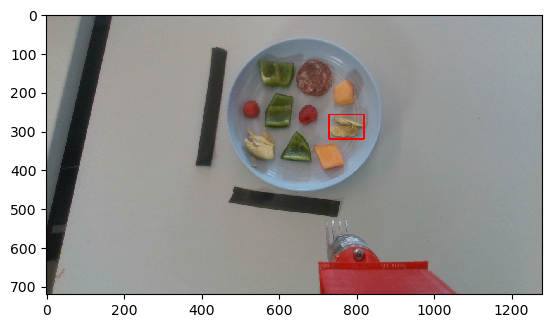

PREDICTION :: 4, SCORE :: 0.24632948637008667
651


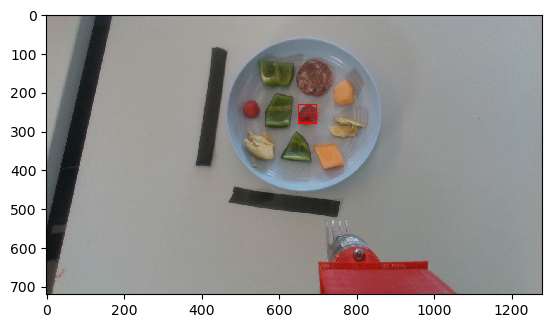

PREDICTION :: 5, SCORE :: 0.18778222799301147
725


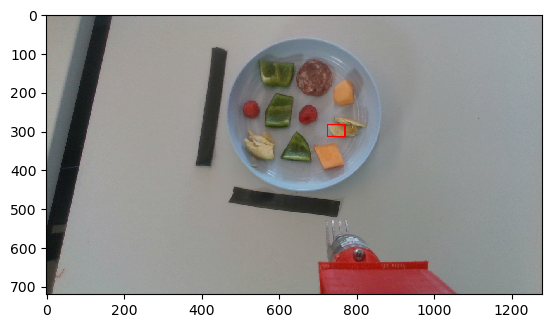

PREDICTION :: 8, SCORE :: 0.17683646082878113
741


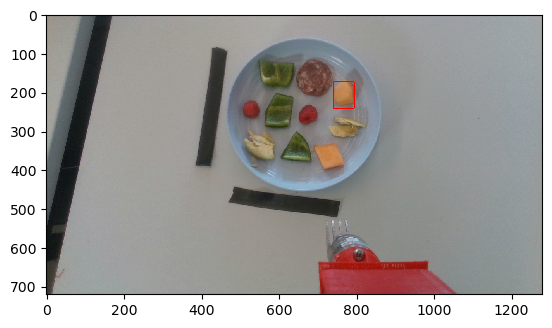

PREDICTION :: 1, SCORE :: 0.16248340904712677
507


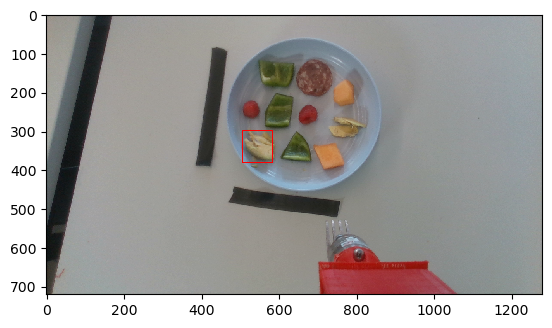

PREDICTION :: 5, SCORE :: 0.15919792652130127
512


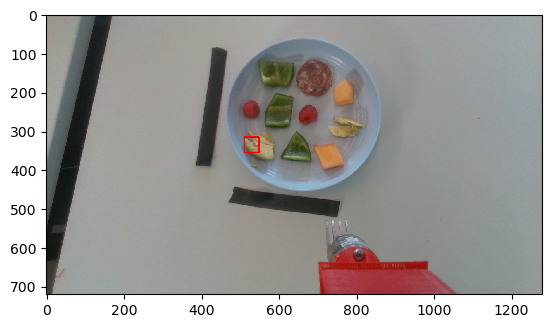

PREDICTION :: 6, SCORE :: 0.15150175988674164
685


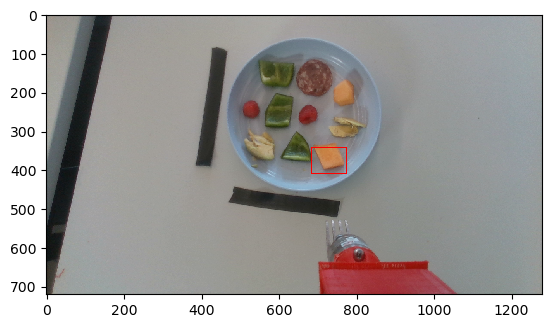

PREDICTION :: 8, SCORE :: 0.146621435880661
648


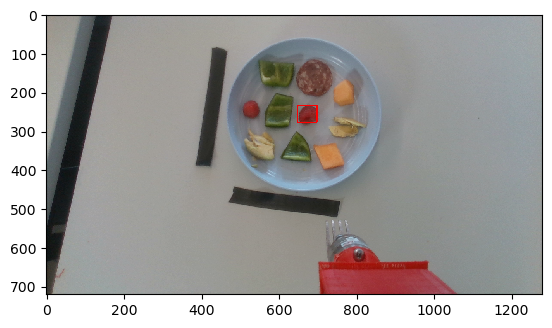

PREDICTION :: 2, SCORE :: 0.12986858189105988
738


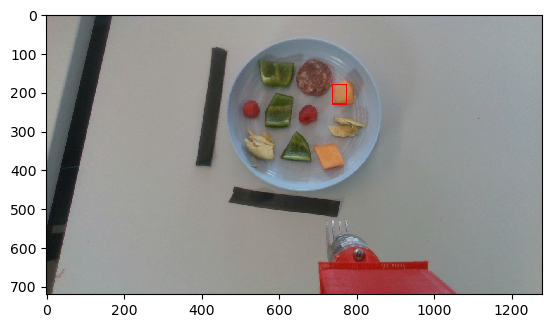

PREDICTION :: 6, SCORE :: 0.12963740527629852
739


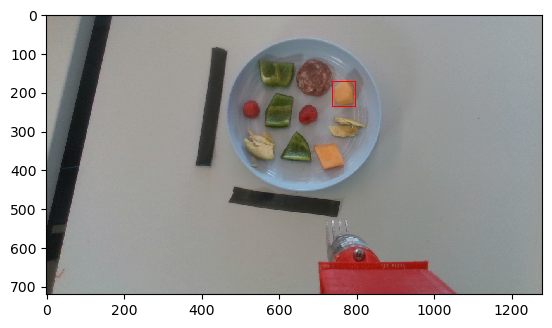

PREDICTION :: 8, SCORE :: 0.1231536939740181
506


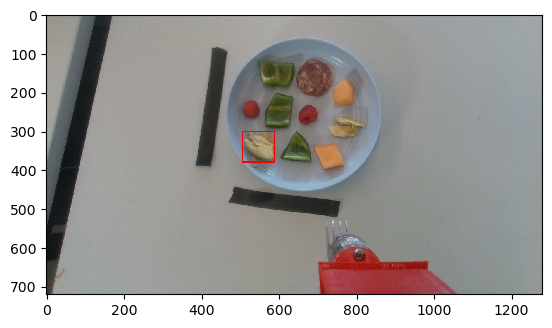

PREDICTION :: 5, SCORE :: 0.12090025097131729
672


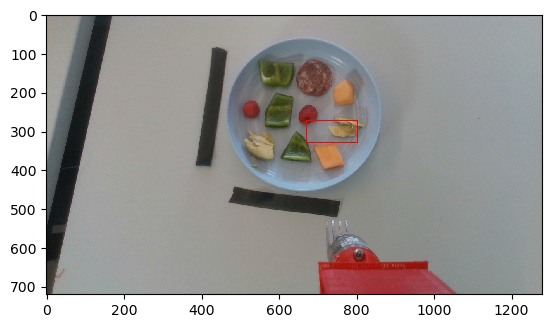

PREDICTION :: 8, SCORE :: 0.11850730329751968
648


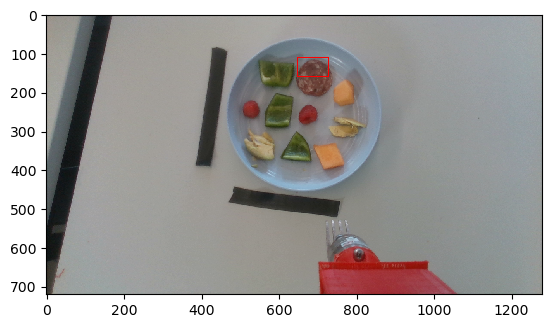

PREDICTION :: 1, SCORE :: 0.10784102231264114
649


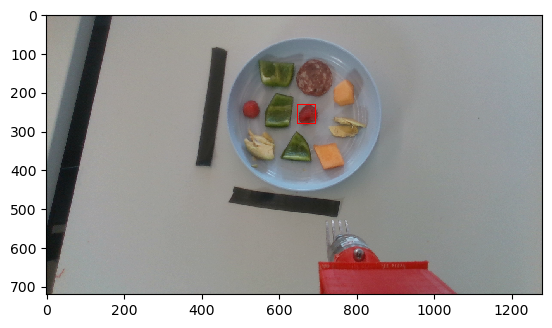

PREDICTION :: 5, SCORE :: 0.10223711282014847
735


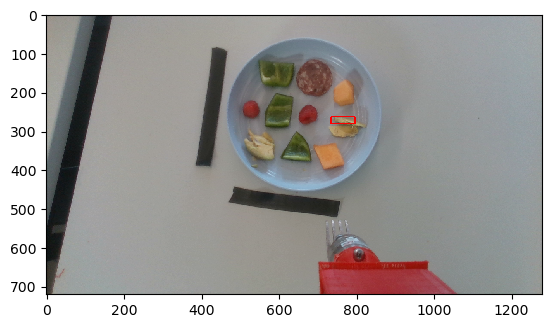

PREDICTION :: 8, SCORE :: 0.10038916766643524
727


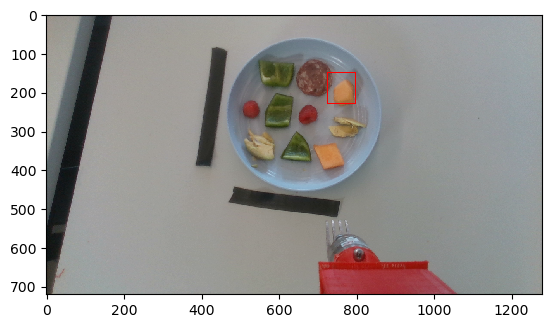

PREDICTION :: 8, SCORE :: 0.09626426547765732
504


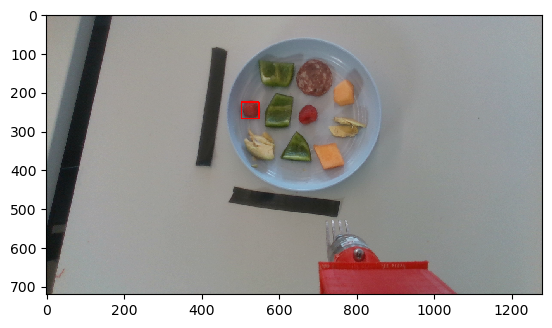

PREDICTION :: 5, SCORE :: 0.08569769561290741
647


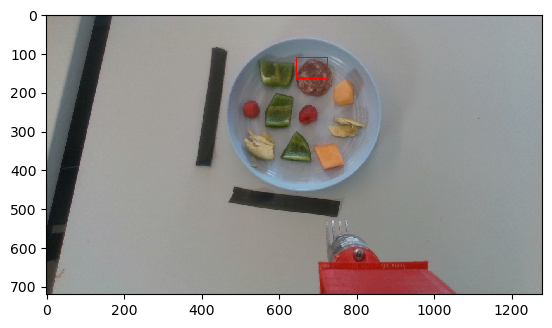

PREDICTION :: 5, SCORE :: 0.07787187397480011
739


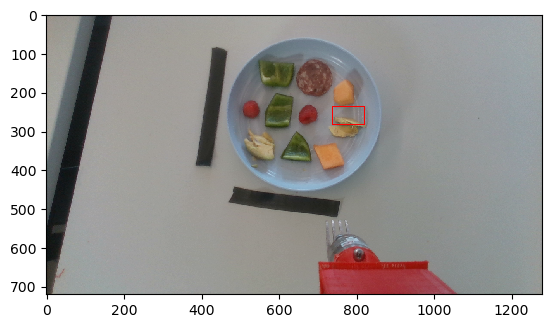

PREDICTION :: 6, SCORE :: 0.07517139613628387
717


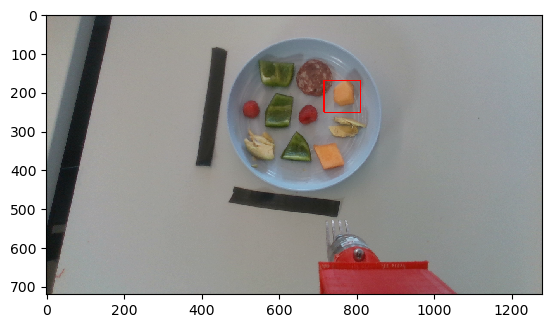

PREDICTION :: 1, SCORE :: 0.06435277312994003
546


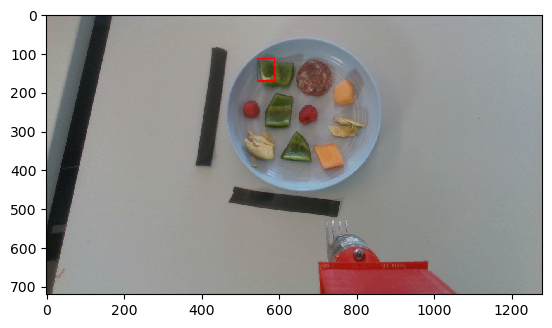

PREDICTION :: 2, SCORE :: 0.06405976414680481
744


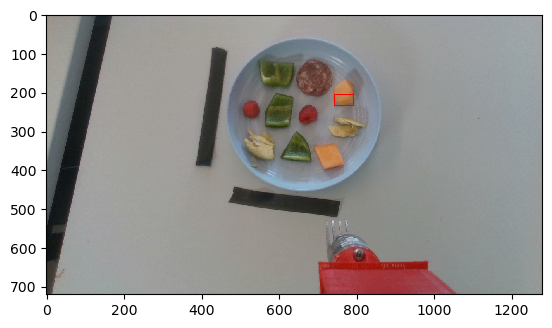

PREDICTION :: 21, SCORE :: 0.06384281069040298
1122


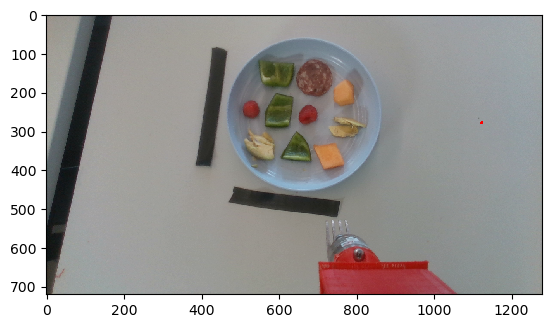

PREDICTION :: 8, SCORE :: 0.06270314753055573
552


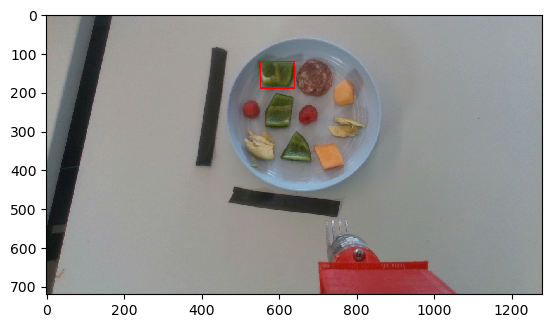

PREDICTION :: 2, SCORE :: 0.0615500882267952
740


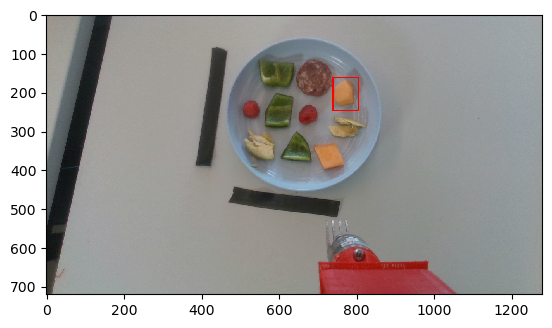

PREDICTION :: 2, SCORE :: 0.06154605373740196
645


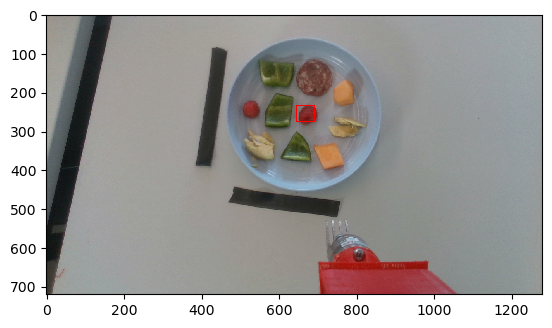

PREDICTION :: 4, SCORE :: 0.061460696160793304
640


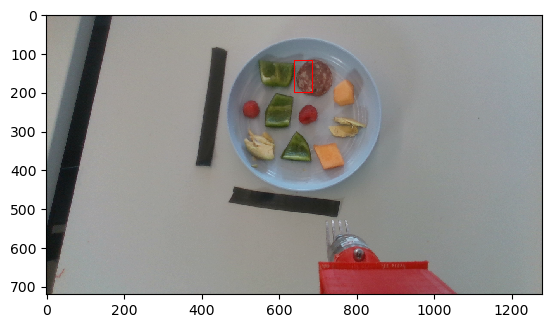

PREDICTION :: 2, SCORE :: 0.05951002612709999
772


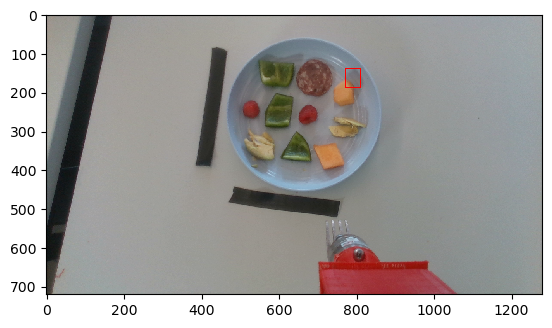

PREDICTION :: 5, SCORE :: 0.058383017778396606
540


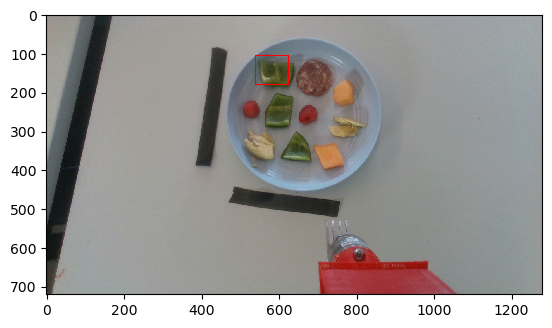

PREDICTION :: 21, SCORE :: 0.05686580389738083
1106


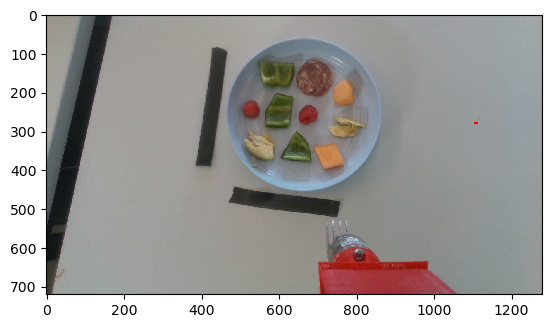

PREDICTION :: 21, SCORE :: 0.05595474690198898
1118


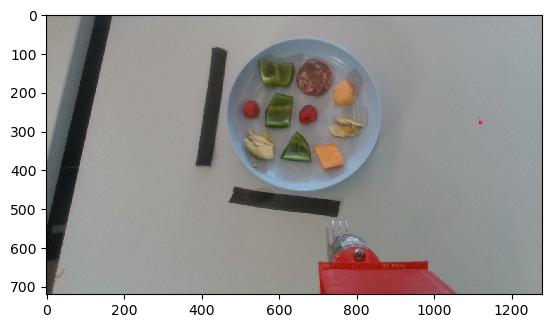

PREDICTION :: 1, SCORE :: 0.0548982098698616
721


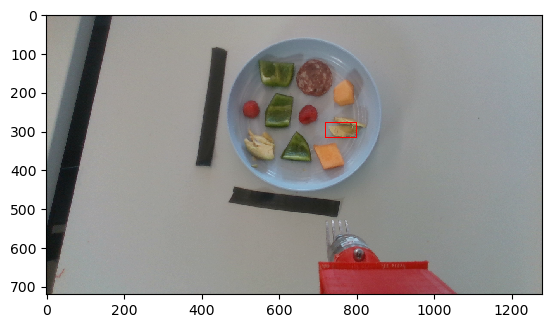

PREDICTION :: 21, SCORE :: 0.054122019559144974
1109


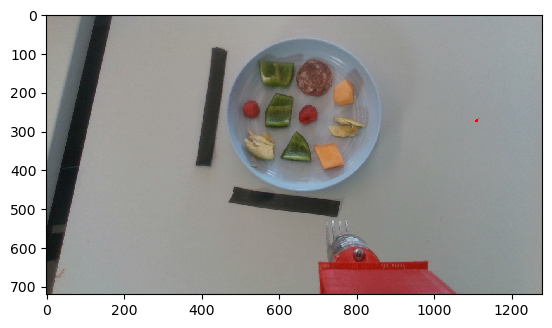

PREDICTION :: 2, SCORE :: 0.05372489243745804
739


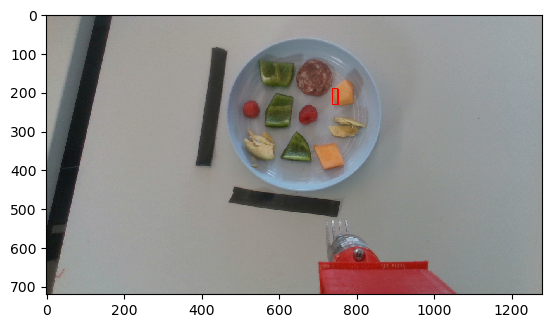

PREDICTION :: 9, SCORE :: 0.053370945155620575
508


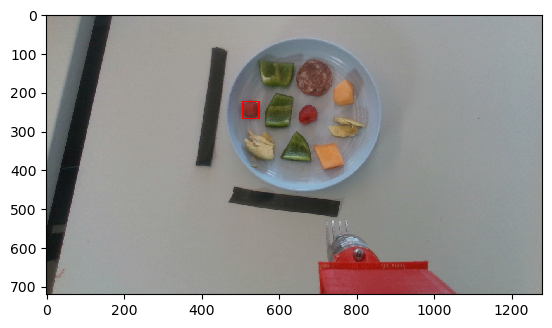

PREDICTION :: 21, SCORE :: 0.05319925770163536
1108


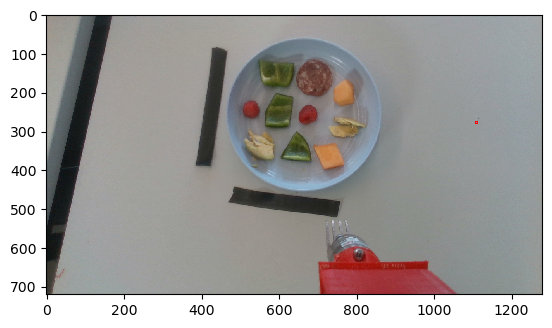

PREDICTION :: 2, SCORE :: 0.05291017144918442
740


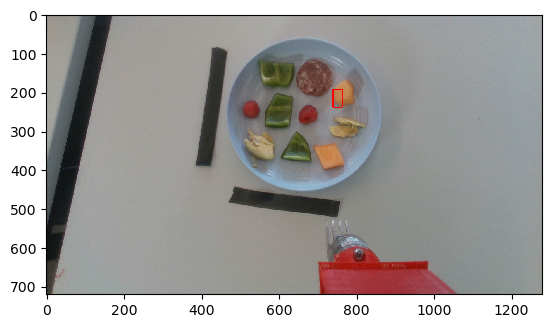

PREDICTION :: 21, SCORE :: 0.052491072565317154
1108


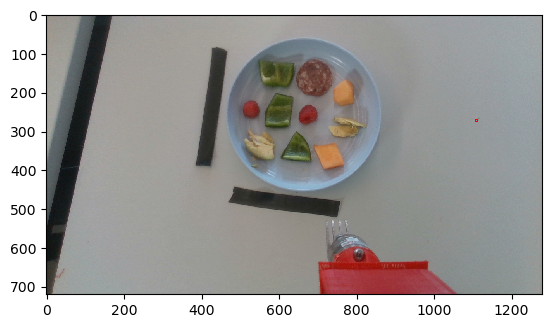

PREDICTION :: 5, SCORE :: 0.052400968968868256
648


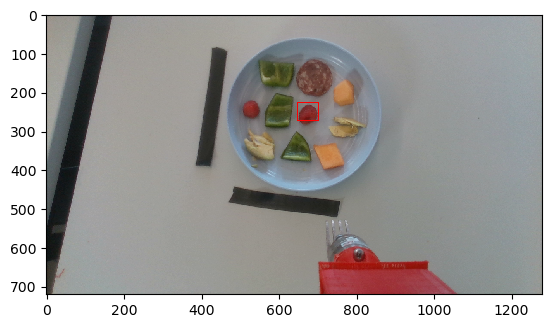

PREDICTION :: 4, SCORE :: 0.0522320456802845
611


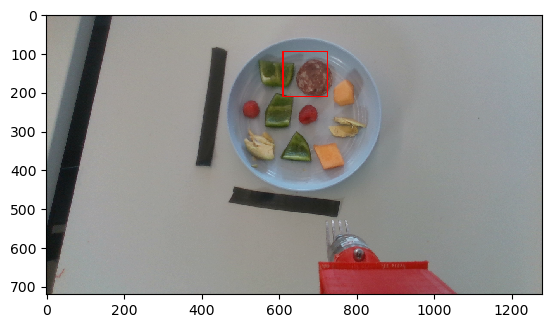

PREDICTION :: 9, SCORE :: 0.051963143050670624
649


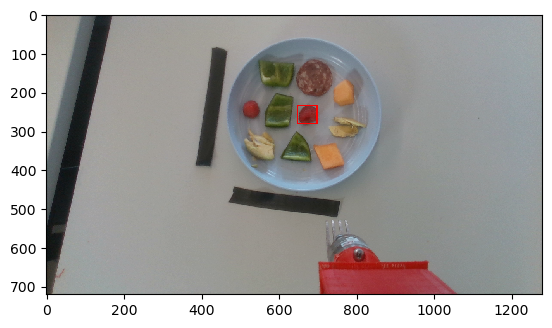

PREDICTION :: 21, SCORE :: 0.0513964407145977
1104


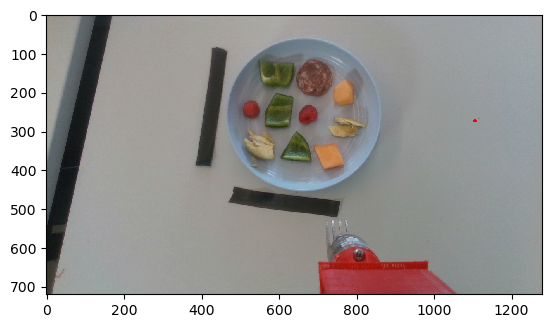

PREDICTION :: 2, SCORE :: 0.05108349770307541
728


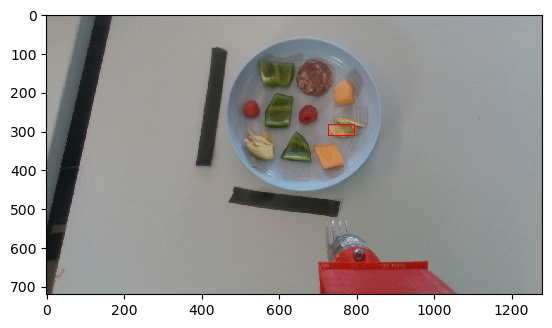

PREDICTION :: 21, SCORE :: 0.05077185481786728
1110


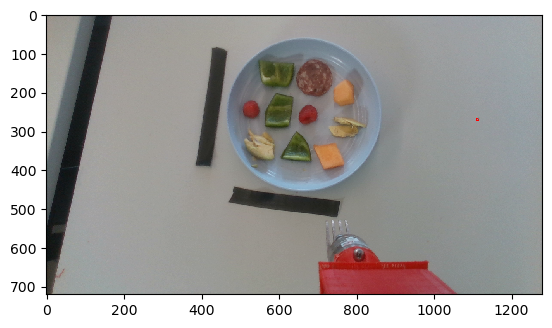

PREDICTION :: 21, SCORE :: 0.05043146386742592
1107


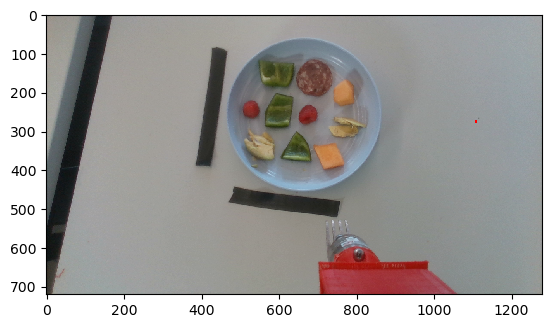

In [22]:
print(pred[0].keys())
n_predictions = 1

for i in range(n_predictions):
    instance_pred = pred[i]
    o
    

for i in range(n_predictions):
    draw_img = npz_data['image'].copy()
    print("PREDICTION :: {}, SCORE :: {}".format(pred[0]['labels'][i], pred[0]['scores'][i]))
    box = pred[0]['boxes'][i].detach().numpy()
    x1, y1, x2, y2 = [int(x) for x in box]
    print(x1)
    cv2.rectangle(draw_img, (x1,y1), (x2,y2), color=[255,0,0], thickness=2)
    plt.imshow(draw_img)
    plt.show()
